In [1]:
import pandas as pd
import os
import requests
from matplotlib import rcParams
from numpy import radians, sin, cos, arccos, arctan2, sqrt, exp

import seaborn as sns
from glob import glob
import time 
import numpy as np
# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

import warnings
warnings.filterwarnings("ignore")

In [2]:
def calculateDistance(lat1, lon1, lat2, lon2):
    lat1 = radians(lat1)
    lat2 = radians(lat2)
    lon1 = radians(lon1)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    R = 6371.0
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * arctan2(sqrt(a), sqrt(1 - a))

    return R * c

r_earth = 6378
def lat_long_range(lat, long, radius):
    dx = dy = 1 + radius
    lat_upper = lat + abs((dy / r_earth) * (180 / np.pi))
    lat_lower = lat - abs((dy / r_earth) * (180 / np.pi))
    long_upper = long + abs((dx / r_earth) * (180 / np.pi) / cos(lat * np.pi/180))
    long_lower = long - abs((dx / r_earth) * (180 / np.pi) / cos(lat * np.pi/180))
    return lat_upper, lat_lower, long_upper, long_lower

In [3]:
data_dir = 'C:/Users/harry/Documents/data/'
report_dir = 'C:/Users/harry/OneDrive - Cushman & Wakefield/realsight/report/'

In [ ]:
from connection_func import DB_connect
db_connect = DB_connect()
start_time = time.time()
sql_dir = 'C:/Users/harry/OneDrive - Cushman & Wakefield/Documents/SQL Server Management Studio/'
file = open(os.path.join(sql_dir, 'Import Processed Full RM Rental House Data.sql'), 'r')
sqlFile = file.read()
file.close()
rightmove_rental_df = db_connect.read_sql(query=sqlFile)
end_time  = time.time()
elapsed_time = (end_time - start_time)/60
print('Execution time:', elapsed_time, 'mins')

In [ ]:
# Schools Data
schools_df = pd.read_excel(os.path.join(data_dir, 'edubasealldata20211030.xlsx'))

# Amenity Data
amenity_query = (f"SELECT * FROM [CH].[FSA_Amenity_v2] WHERE (RatingDate>= '2020-01-01')")
amenity_df = db_connect.read_sql(query=amenity_query)
# clean amenity lat longs 
amenity_df.dropna(subset=['Latitude', 'Longitude'], inplace=True)
amenity_df['Latitude'] = amenity_df['Latitude'].astype(float)
amenity_df['Longitude'] = amenity_df['Longitude'].astype(float)

In [ ]:
# HL - CODE - AMENITY
data_df = rightmove_rental_df
radius = 0.5
master_sfa_neighbour_df  = pd.DataFrame()

for idx, row in data_df.iterrows():
    time0 = time.time()
    lat, long, original_add = row['latitude'], row['longitude'], row['listing_id']
    lat_upper, lat_lower, long_upper, long_lower = lat_long_range(lat, long, radius)    
    neighbour_amenity_df = amenity_df[(amenity_df['Latitude']>lat_lower) & (amenity_df['Latitude']<lat_upper) & \
                                     (amenity_df['Longitude']>long_lower) & (amenity_df['Longitude']<long_upper)]
    if not neighbour_amenity_df.empty:
        dist_list_df = calculateDistance(lat, long, neighbour_amenity_df['Latitude'], neighbour_amenity_df['Longitude'])
        neighbour_amenity_df['LSOA11CD'] = original_add 
        neighbour_amenity_df['dist_to_target'] = dist_list_df
        neighbour_amenity_df = neighbour_amenity_df[neighbour_amenity_df['dist_to_target']<radius]
    
        master_sfa_neighbour_df = pd.concat([master_sfa_neighbour_df, neighbour_amenity_df])
        print(idx, original_add, neighbour_amenity_df.shape)
        end_time = time.time()
#         print('SFA Point Analysis time taken {} seconds'.format(end_time - time0))
        

In [ ]:
master_sfa_neighbour_df.rename({'LSOA11CD': 'listing_id'}, axis=1, inplace=True)

In [ ]:
for bustype in amenity_df['BusinessType'].unique():
    temp_df = master_sfa_neighbour_df.groupby(by=['listing_id', 'BusinessType']).count()['FHRSID'].reset_index()
    data_df = data_df.merge(temp_df[temp_df['BusinessType']==bustype], on='listing_id', how='left')
    data_df.drop('BusinessType', axis=1, inplace=True)
    data_df.rename({'FHRSID': bustype+'Within500m'}, axis=1, inplace=True)

In [ ]:
# HL - CODE - SCHOOLS
radius = 1
master_schools_neighbours_df = pd.DataFrame()

for idx, row in data_df.iterrows():
    time0 = time.time()
    lat, long, original_add = row['latitude'], row['longitude'], row['listing_id']
    lat_upper, lat_lower, long_upper, long_lower = lat_long_range(lat, long, radius)    
    neighbour_amenity_df = schools_df[(schools_df['Latitude\xa0']>lat_lower) & (schools_df['Latitude\xa0']<lat_upper) & \
                                     (schools_df['Longitude\xa0']>long_lower) & (schools_df['Longitude\xa0']<long_upper)]
    if not neighbour_amenity_df.empty:
        dist_list_df = calculateDistance(lat, long, neighbour_amenity_df['Latitude\xa0'], neighbour_amenity_df['Longitude\xa0'])
        neighbour_amenity_df['LSOA11CD'] = original_add 
        neighbour_amenity_df['dist_to_target'] = dist_list_df
        neighbour_amenity_df = neighbour_amenity_df[neighbour_amenity_df['dist_to_target']<radius]    
        master_schools_neighbours_df = pd.concat([master_schools_neighbours_df, neighbour_amenity_df])
        print(idx, original_add, neighbour_amenity_df.shape)
        end_time = time.time()
        print('SFA Point Analysis time taken {} seconds'.format(end_time - time0))


In [ ]:
master_schools_neighbours_df.rename({'LSOA11CD': 'listing_id'}, axis=1, inplace=True)
data_df = data_df.merge(master_schools_neighbours_df.groupby(by='listing_id').count()['URN'].reset_index(), 
                                how='left', on='listing_id')
data_df.rename({'URN': 'SchoolsWithin1km'}, axis=1, inplace=True)

In [ ]:
# load cities, motorways, stations

motorway_junct_df = pd.read_csv(os.path.join(data_dir,'OS_Motorway_Junctions_v3.csv'))
station_name_df = pd.read_csv(os.path.join(data_dir,'uk_stations_lat_lon_full_v2.csv'))
city_dist_df = pd.read_excel(os.path.join(data_dir, 'archive/Major_Cities.xlsx'))
# load demographics data
demograph_df = pd.read_csv(os.path.join(data_dir,'LSOA Demographic Data.csv'))

# postcode to LSOA
postcode_to_losa_df = pd.read_csv(os.path.join(data_dir,'PostcodetoLSOA.csv'))

In [ ]:
# calculate distance and name of closest city (unweighted for now)

nearest_no_cities = 1

postcode_dist_city_df = pd.DataFrame()
postcode_dist_city_df['listing_id'] = data_df['listing_id']

lat2 = data_df['latitude']
lon2 = data_df['longitude']

for city in city_dist_df['City']: 

    lat1 = list(city_dist_df.loc[city_dist_df['City']==city]['Lat'])[0]
    lon1 = list(city_dist_df.loc[city_dist_df['City']==city]['Lon'])[0]
    
    postcode_dist_city_df[city] = calculateDistance(lat1, lon1, lat2, lon2)
    
# Transpose dataframes
city_dist_df = postcode_dist_city_df 

city_dist_df = city_dist_df.T
new_header = city_dist_df.iloc[0] 
city_dist_df = city_dist_df[1:] 
city_dist_df.columns = new_header

city_dist_df = city_dist_df.apply(pd.to_numeric)
data_df['Dist_to_City'] =  city_dist_df.min().values
data_df['Nearest_City'] = city_dist_df.idxmin().values

In [ ]:
nearest_no_motorways = 1
motorway_dist_df = pd.DataFrame()
motorway_dist_df['listing_id'] = data_df['listing_id']
lat2 = data_df['latitude']
lon2 = data_df['longitude']
for motorway in motorway_junct_df['Motorway']: 

    lat1 = list(motorway_junct_df.loc[motorway_junct_df['Motorway']==motorway]['Lat'])[0]
    lon1 = list(motorway_junct_df.loc[motorway_junct_df['Motorway']==motorway]['Lon'])[0]
    
    motorway_dist_df[motorway] = calculateDistance(lat1, lon1, lat2, lon2)
    
# Transpose dataframes
motorway_dist_df = motorway_dist_df.T
new_header = motorway_dist_df.iloc[0] 
motorway_dist_df = motorway_dist_df[1:] 
motorway_dist_df.columns = new_header

motorway_dist_df = motorway_dist_df.apply(pd.to_numeric)
data_df['Dist_to_Motorway'] =  motorway_dist_df.min().values
data_df['Nearest_Motorway'] = motorway_dist_df.idxmin().values

In [ ]:
# New HL code stations - edited
station_dist_df = pd.DataFrame()
station_dist_df['listing_id'] = data_df['listing_id']
lat2 = data_df['latitude']
lon2 = data_df['longitude']
for station in station_name_df['Station Name']: 
    lat1 = list(station_name_df.loc[station_name_df['Station Name']==station]['Lat'])[0]
    lon1 = list(station_name_df.loc[station_name_df['Station Name']==station]['Lon'])[0]
    station_dist_df[station] = calculateDistance(lat1, lon1, lat2, lon2)
    
# Transpose dataframes
station_dist_df = station_dist_df.T
new_header = station_dist_df.iloc[0] 
station_dist_df = station_dist_df[1:] 
station_dist_df.columns = new_header

station_dist_df = station_dist_df.apply(pd.to_numeric)
data_df['Dist_to_Station'] =  station_dist_df.min().values
data_df['Nearest_Station'] = station_dist_df.idxmin().values

In [ ]:
postcode_to_losa_df['LSOA_Code']

In [ ]:
# merge with LR EPC
data_df = data_df.merge(postcode_to_losa_df[['Postcode', 'LSOA_Code']], left_on='postcode', 
                        right_on='Postcode', how='left')
data_df = data_df.merge(demograph_df, left_on='LSOA_Code', right_on='Area_Name', how='left')

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
corr_df = pd.DataFrame(data_df.corr()['price'].sort_values())
corr_df = corr_df.round(decimals=3)
corr_df.loc['_Average_Household_Income'].values[0]

In [ ]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(11.7,8.27)})
fig, axes = plt.subplots(3, 3, figsize=(15, 15)) 
g = sns.regplot(ax=axes[0, 0], data=data_df, x='_Average_Household_Income', y='price', line_kws={"color": "red"}).set(
    xlabel='Average Household Income (r={})'.format(corr_df.loc['_Average_Household_Income'].values[0]), alpha=0.01)
g = sns.regplot(ax=axes[0, 1], data=data_df, x='2.D__City_Sophisticates', y='price', line_kws={"color": "red"}).set(
    xlabel='2.D__City_Sophisticates (r={})'.format(corr_df.loc['2.D__City_Sophisticates'].values[0]), alpha=0.01)
g = sns.regplot(ax=axes[0, 2], data=data_df, x='Social_Grade_DE', y='price', line_kws={"color": "red"}, order=2).set(
    xlabel='Social_Grade_DE (r={})'.format(corr_df.loc['Social_Grade_DE'].values[0]), alpha=0.01)

sns.regplot(ax=axes[1, 0], data=data_df, x='Restaurant/Cafe/CanteenWithin500m', y='price', line_kws={"color": "red"}).set(
    xlabel='Restaurant/Cafe/CanteenWithin500m (r={})'.format(corr_df.loc['Restaurant/Cafe/CanteenWithin500m'].values[0]), alpha=0.01)
sns.regplot(ax=axes[1, 1], data=data_df, x='SchoolsWithin1km', y='price', line_kws={"color": "red"}).set(
    xlabel='SchoolsWithin1km (r={})'.format(corr_df.loc['SchoolsWithin1km'].values[0]), alpha=0.01)
sns.regplot(ax=axes[1, 2], data=data_df, x='Retailers - otherWithin500m', y='price', line_kws={"color": "red"}, order=2).set(
    xlabel='Retailers - otherWithin500m (r={})'.format(corr_df.loc['Retailers - otherWithin500m'].values[0]), alpha=0.01)


sns.regplot(ax=axes[2, 0], data=data_df, x='Dist_to_City', y='price', line_kws={"color": "red"}, order=2).set(
    xlabel='Dist_to_City (r={})'.format(corr_df.loc['Dist_to_City'].values[0]), alpha=0.01)
sns.regplot(ax=axes[2, 1], data=data_df, x='Dist_to_Station', y='price', line_kws={"color": "red"}, order=2).set(
    xlabel='Dist_to_Station (r={})'.format(corr_df.loc['Dist_to_Station'].values[0]), alpha=0.01)
sns.regplot(ax=axes[2, 2], data=data_df, x='Dist_to_Motorway', y='price', line_kws={"color": "red"}, order=2).set(
    xlabel='Dist_to_Motorway (r={})'.format(corr_df.loc['Dist_to_Motorway'].values[0]), alpha=0.01)

title = "Rightmove Rent Correlation Analysis for Houses Jan to Sep 2022"
# fig.suptitle(title)
plt.savefig(os.path.join(report_dir, title+'.png'))

In [19]:
df_prediction.corr()['price'].sort_values()

latitude                      -0.460143
7._Routine_occupations        -0.369034
6._Semi-routine_occupations   -0.354697
Social_Grade_DE               -0.314516
Social_Grade_C2               -0.305854
                                 ...   
_Average_Household_Income      0.478345
price                          1.000000
raw_price                      1.000000
affordable_flag                     NaN
RN                                  NaN
Name: price, Length: 129, dtype: float64

In [1]:
# sns.scatterplot(data=df_prediction, x='latitude', y='price')

In [ ]:
# drop unnecessary columns
df_prediction = data_df

# fill in missing values
df_prediction['Restaurant/Cafe/CanteenWithin500m'] = df_prediction['Restaurant/Cafe/CanteenWithin500m'].fillna(0)
df_prediction['Retailers - otherWithin500m'] = df_prediction['Retailers - otherWithin500m'].fillna(0)
df_prediction['Hospitals/Childcare/Caring PremisesWithin500m'] = df_prediction['Hospitals/Childcare/Caring PremisesWithin500m'].fillna(0)
df_prediction['Manufacturers/packersWithin500m'] = df_prediction['Manufacturers/packersWithin500m'].fillna(0)
df_prediction['School/college/universityWithin500m'] = df_prediction['School/college/universityWithin500m'].fillna(0)
df_prediction['Takeaway/sandwich shopWithin500m'] = df_prediction['Takeaway/sandwich shopWithin500m'].fillna(0)
df_prediction['Retailers - supermarkets/hypermarketsWithin500m'] = df_prediction['Retailers - supermarkets/hypermarketsWithin500m'].fillna(0)
df_prediction['SchoolsWithin1km'] = df_prediction['SchoolsWithin1km'].fillna(0)

# drop additional columns
df_prediction = df_prediction.drop(['Other catering premisesWithin500m',  'Distributors/TransportersWithin500m',
       'Hotel/bed & breakfast/guest houseWithin500m',
       'Mobile catererWithin500m', 'Pub/bar/nightclubWithin500m',
       'Farmers/growersWithin500m', 'Importers/ExportersWithin500m'], axis=1)

# change demographic data from actuals to %
df_prediction['1.A__Lavish_Lifestyles'] = df_prediction['1.A__Lavish_Lifestyles'] / df_prediction['Base_Households']
df_prediction['1.B__Executive_Wealth'] = df_prediction['1.B__Executive_Wealth'] / df_prediction['Base_Households']
df_prediction['1.C__Mature_Money'] = df_prediction['1.C__Mature_Money'] / df_prediction['Base_Households']
df_prediction['2.D__City_Sophisticates'] = df_prediction['2.D__City_Sophisticates'] / df_prediction['Base_Households']
df_prediction['2.E__Career_Climbers'] = df_prediction['2.E__Career_Climbers'] / df_prediction['Base_Households']
df_prediction['3.F__Countryside_Communities'] = df_prediction['3.F__Countryside_Communities'] / df_prediction['Base_Households']
df_prediction['3.G__Successful_Suburbs'] = df_prediction['3.G__Successful_Suburbs'] / df_prediction['Base_Households']
df_prediction['3.H__Steady_Neighbourhoods'] = df_prediction['3.H__Steady_Neighbourhoods'] / df_prediction['Base_Households']
df_prediction['3.I__Comfortable_Seniors'] = df_prediction['3.I__Comfortable_Seniors'] / df_prediction['Base_Households']
df_prediction['3.J__Starting_Out'] = df_prediction['3.J__Starting_Out'] / df_prediction['Base_Households']
df_prediction['4.K__Student_Life'] = df_prediction['4.K__Student_Life'] / df_prediction['Base_Households']
df_prediction['4.L__Modest_Means'] = df_prediction['4.L__Modest_Means'] / df_prediction['Base_Households']
df_prediction['4.M__Striving_Families'] = df_prediction['4.M__Striving_Families'] / df_prediction['Base_Households']
df_prediction['4.N__Poorer_Pensioners'] = df_prediction['4.N__Poorer_Pensioners'] / df_prediction['Base_Households']
df_prediction['5.O__Young_Hardship'] = df_prediction['5.O__Young_Hardship'] / df_prediction['Base_Households']
df_prediction['5.P__Struggling_Estates'] = df_prediction['5.P__Struggling_Estates'] / df_prediction['Base_Households']
df_prediction['5.Q__Difficult_Circumstances'] = df_prediction['5.Q__Difficult_Circumstances'] / df_prediction['Base_Households']
df_prediction['6.R__Not_Private_Households'] = df_prediction['6.R__Not_Private_Households'] / df_prediction['Base_Households']

df_prediction['year_built'].fillna(df_prediction['year_built'].median(), inplace=True)
df_prediction = pd.concat([df_prediction, pd.get_dummies(df_prediction['development_flag'], prefix='NewBuild')])
df_prediction = pd.concat([df_prediction, pd.get_dummies(df_prediction['prop_type'], prefix='Prop_Type')])

# fill in mising as average
df_prediction = df_prediction.fillna(df_prediction.median())

In [ ]:
df_prediction.to_csv(os.path.join(report_dir, 'RM Rental Processed Data - House .csv'), index=False)

# Part 3 - Model Traning 

In [4]:
df_prediction = pd.read_csv(os.path.join(report_dir, 'RM Rental Processed Data - House .csv'))
df_prediction.drop_duplicates(subset=['listing_id'], inplace=True)

In [65]:
target_col = ['longitude', 'latitude', 'bedrooms', 'bathrooms',
       'Restaurant/Cafe/CanteenWithin500m', 'Retailers - otherWithin500m',
       'Hospitals/Childcare/Caring PremisesWithin500m',
       'Manufacturers/packersWithin500m',
       'School/college/universityWithin500m',
       'Takeaway/sandwich shopWithin500m',
       'Retailers - supermarkets/hypermarketsWithin500m', 'Base_Population',
       'Base_Households', '1.A__Lavish_Lifestyles', '1.B__Executive_Wealth',
       '1.C__Mature_Money', '2.D__City_Sophisticates', '2.E__Career_Climbers',
       '3.F__Countryside_Communities', '3.G__Successful_Suburbs',
       '3.H__Steady_Neighbourhoods', '3.I__Comfortable_Seniors',
       '3.J__Starting_Out', '4.K__Student_Life', '4.L__Modest_Means',
       '4.M__Striving_Families', '4.N__Poorer_Pensioners',
       '5.O__Young_Hardship', '5.P__Struggling_Estates',
       '5.Q__Difficult_Circumstances', '6.R__Not_Private_Households',
       '_Average_Household_Income',
#        '1._Higher_managerial,_administrative_and_professional_occupations',
#        '2._Lower_managerial,_administrative_and_professional_occupations',
#        '3._Intermediate_occupations',
#        '4._Small_employers_and_own_account_workers',
#        '5._Lower_supervisory_and_technical_occupations',
#        '6._Semi-routine_occupations', '7._Routine_occupations', 'Never_worked',
       'Long-term_unemployed', 'Full-time_students', 
              'Dist_to_City',
       'Dist_to_Motorway', 'Dist_to_Station', 'avg_days_on_market',
       'SchoolsWithin1km',  'NewBuild_F',
#              'NewBuild_T',
             'Prop_Type_House - Detached',
             'Prop_Type_House - Semi-Detached',
             'Prop_Type_House - Terraced',
             'Prop_Type_House - Unspecified']

X = df_prediction[target_col]
y = df_prediction['price']


# remove highly correlated features#
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
df1 = X.drop(X[to_drop], axis=1)
to_drop

[]

In [97]:
# scale
# Import ML tools
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split, RandomizedSearchCV, learning_curve
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics.pairwise import cosine_similarity

x_scaler = MinMaxScaler(feature_range=(0, 1))
x_scaler.fit(df1)
X_Scaled = pd.DataFrame(x_scaler.transform(df1))

y_scaler = MinMaxScaler(feature_range=(0, 1))
y_scaler.fit(y.values.reshape(-1, 1))
y_Scaled = pd.DataFrame(y_scaler.transform(y.values.reshape(-1, 1)))

In [98]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_Scaled, 
                                                    y_Scaled,
                                                    test_size=0.4,
                                                    random_state=1)

In [69]:
import lightgbm as lgb
model = lgb.LGBMClassifier()

def algorithm_pipeline(X_train_data, X_test_data, y_train_data, y_test_data, 
                       model, param_grid, cv=5, scoring_fit='r2',
                       do_probabilities = False):
    gs = GridSearchCV(
        estimator=model,
        param_grid=param_grid, 
        cv=cv, 
        n_jobs=-1, 
        scoring=scoring_fit,
        verbose=2
    )
    fitted_model = gs.fit(X_train_data, y_train_data)
    
    if do_probabilities:
        pred = fitted_model.predict_proba(X_test_data)
    else:
        pred = fitted_model.predict(X_test_data)
    
    return fitted_model, pred

model = lgb.LGBMRegressor()
param_grid = {
    'n_estimators': [400, 700, 1000],
    'max_depth': [15,20,25],

}

model, pred = algorithm_pipeline(X_train, X_test, y_train, y_test, model, 
                                 param_grid, cv=5, scoring_fit='r2')
print(model.best_score_)
print(model.best_params_)
model = model.best_estimator_
new_score = cross_val_score(model, X_Scaled, y_Scaled, scoring="r2", cv=cv).mean()
print(new_score)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
0.8368031763332031
{'max_depth': 25, 'n_estimators': 700}


In [99]:
print('Score: ', model.score(X_Scaled,y_Scaled))
y_pred = model.predict(X_Scaled)
print("R^2 : ", r2_score(y_Scaled, y_pred))
print("MAE :", mean_absolute_error(y_Scaled,y_pred))
print("RMSE:",np.sqrt(mean_squared_error(y_Scaled, y_pred)))

test_temp_df = df_prediction
test_temp_df['Pred_Price'] = y_scaler.inverse_transform(y_pred.reshape(-1, 1))
test_temp_df['Actual_Price'] = y_scaler.inverse_transform(y_Scaled)
test_temp_df['Difference'] = test_temp_df['Pred_Price'] - test_temp_df['Actual_Price'] 
test_temp_df['Difference%'] = (test_temp_df['Pred_Price'] - test_temp_df['Actual_Price'] )/ test_temp_df['Actual_Price'] 

Score:  0.8949105455693386
R^2 :  0.8949105455693386
MAE : 0.017599934835014812
RMSE: 0.026940255774057398


In [108]:
pred_table_df = pd.read_excel(os.path.join(data_dir,'RS2PredTable.xlsx'))
pred_table_df.drop(['difference', 'actual_price_sqft', 'pred_price_sqft'], axis=1, inplace=True)


In [110]:
temp_df = test_temp_df.groupby(by='LSOA_Code').mean()[['price', 'Pred_Price', 'avg_days_on_market', 'Difference', 'Difference%']].reset_index()
temp_df.columns = ['LSOA_Code', 'rental_avg_houses', 'pred_rental_avg_houses', 'rental_avg_days_on_markets_house', 
                   'difference', 'difference%']
pred_table_df = pred_table_df.merge(temp_df, on='LSOA_Code')

In [112]:
pred_table_df.to_csv(os.path.join(report_dir, 'RealsightRentalPredTable_House.csv'), index=False)

In [129]:
# test_temp_df.reset_index(inplace=True)
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_temp_df.tail(1000).index, 
                         y=test_temp_df.tail(1000)['Pred_Price'],
                        mode='lines+markers', name='Predicted Monthly Rent', opacity=0.65))

fig.add_trace(go.Scatter(x=test_temp_df.tail(1000).index, 
                         y=test_temp_df.tail(1000)['Actual_Price'],
                        mode='lines+markers', name='Actual Monthly Rent', opacity=0.65))


fig.update_layout(
    height=600,
    title_text='',
    xaxis_title="Property ID",
    yaxis_title="Monthly Rent (£)",
)

fig.show()

In [75]:
import pickle
model_name1 = 'LXGB_RM_rental_house_model.sav'

pickle.dump(xgb_r, open(os.path.join(report_dir, model_name1), 'wb'))

# gbm_model = pickle.load(open(os.path.join(report_dir, model_name), 'rb'))         

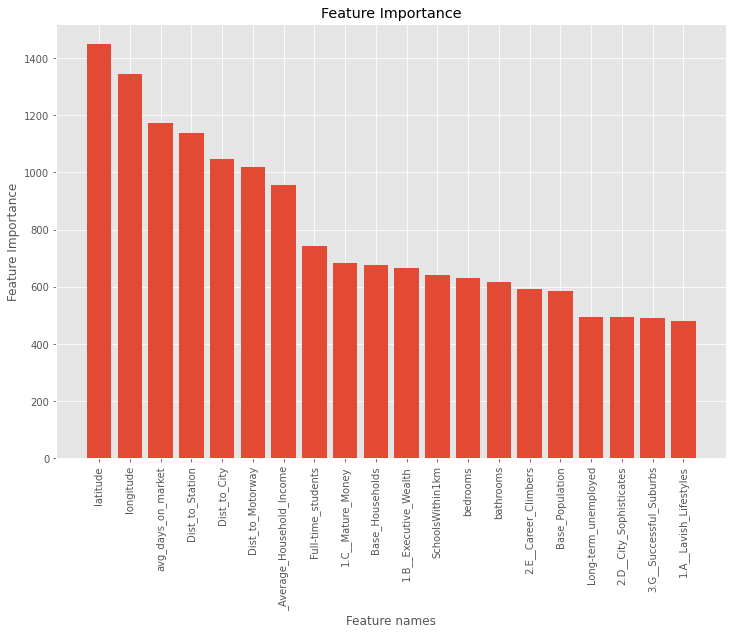

In [135]:
# Feature Importance
%matplotlib inline
mpl.style.use('ggplot')
pylab.rcParams['figure.figsize'] = 12,8
number_of_feature = 20

feature_importance = model.feature_importances_
feature_names = df1.columns
sorted_index = np.argsort(feature_importance)[::-1]
x = list(range(len(feature_importance)))

feature_importance_df = pd.DataFrame(sorted(zip(feature_names, feature_importance), reverse=True), 
                                     columns=['Names', 'importance'])

labels = np.array(feature_names[sorted_index])[:number_of_feature]
plt.bar(x[:number_of_feature], feature_importance[sorted_index][:number_of_feature], tick_label=labels)

plt.xlabel("Feature names")
plt.ylabel("Feature Importance")
plt.title('Feature Importance')
plt.xticks(rotation=90)
plt.show()

In [82]:
import pickle
model_name = 'LXGB_RM_rental_house_model.sav'
xgb_r = pickle.load(open(os.path.join(report_dir, model_name), 'rb'))         
pred_table_df = pd.read_excel(os.path.join(data_dir,'RS2PredTable.xlsx'))
df_prediction = pd.read_csv(os.path.join(report_dir, 'RM Rental Processed Data - House .csv'))


In [102]:
pred_table_df = pd.read_excel(os.path.join(data_dir,'RS2PredTable.xlsx'))
temp_df = df_prediction.groupby(by='LSOA_Code').mean()[['price', 'avg_days_on_market']].reset_index()
temp_df.columns = ['LSOA_Code', 'rental_avg_houses', 'rental_avg_days_on_markets_house']
pred_table_df = pred_table_df.merge(temp_df, on='LSOA_Code')

In [84]:
pred_table_df['avg_days_on_market'] = pred_table_df['rental_avg_days_on_markets_house']
pred_table_df['latitude'] = pred_table_df['Lat']
pred_table_df['longitude'] = pred_table_df['Long']

pred_table_df['bathrooms'] = 1
pred_table_df['bedrooms'] = 3

pred_table_df['NewBuild_F'] = 1
pred_table_df['NewBuild_T'] = 0
pred_table_df['Prop_Type_House - Detached'] = 0
pred_table_df['Prop_Type_House - Semi-Detached'] = 0
pred_table_df['Prop_Type_House - Terraced'] = 1
pred_table_df['Prop_Type_House - Unspecified'] = 0

In [86]:
# scale HL test 
HL_Scaled = pd.DataFrame(x_scaler.transform(pred_table_df[df1.columns]))

# predict
y_pred_1 = model.predict(HL_Scaled)

# re-scaling
y_pred = y_scaler.inverse_transform(y_pred_1.reshape(-1,1))

# transform to 1D array
y_pred = y_pred.ravel()
pred_table_df['pred_rental_avg_houses'] = y_pred
pred_table_df['difference'] = pred_table_df['rental_avg_houses'] - pred_table_df['pred_rental_avg_houses']
pred_table_df['difference%'] = (pred_table_df['rental_avg_houses'] - pred_table_df['pred_rental_avg_houses']) / pred_table_df['rental_avg_houses']



In [74]:
pred_table_df.drop(['avg_days_on_market', 'actual_price_sqft', 'pred_price_sqft'], axis=1, inplace=True)
pred_table_df.to_csv(os.path.join(report_dir, 'RealsightRentalPredTable_House.csv'), index=False)

In [90]:
pred_table_df['difference%'].describe()

count    10586.000000
mean        -0.102825
std          0.196732
min         -2.757232
25%         -0.177148
50%         -0.077731
75%          0.005938
max          0.644486
Name: difference%, dtype: float64

In [104]:
test_temp_df['Difference%'].describe()

count    86151.000000
mean         0.016548
std          0.124524
min         -0.779268
25%         -0.057112
50%          0.009410
75%          0.082446
max          1.991412
Name: Difference%, dtype: float64

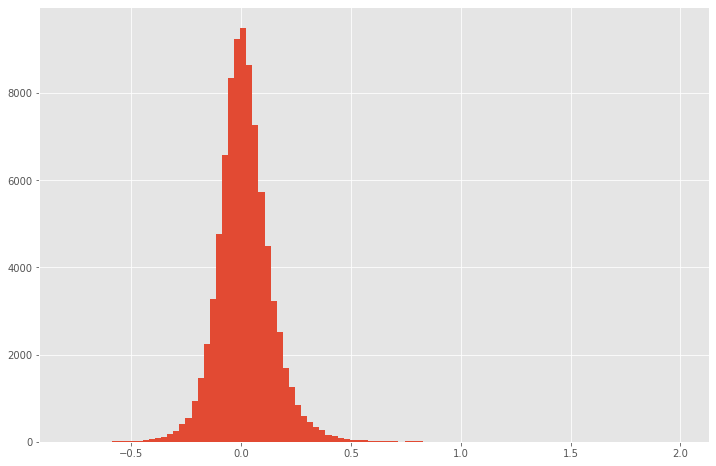

In [103]:
plt.hist(test_temp_df['Difference%'], bins=100)

plt.grid(True)
plt.show()

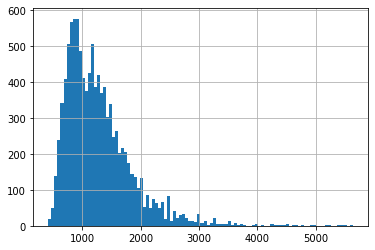

In [101]:
plt.hist(pred_table_df['rental_avg_houses'], bins=100)

plt.grid(True)
plt.show()

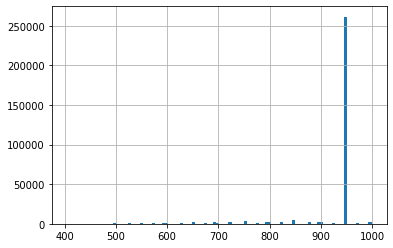

In [95]:
temp_df = df_prediction[df_prediction['price']<1000]
plt.hist(temp_df['price'], bins=100)
plt.grid(True)
plt.show()

In [97]:
df_prediction['price'].value_counts()

950.0     261626
850.0       4214
750.0       3673
1100.0      3267
1200.0      3240
           ...  
693.0          1
1590.0         1
1848.0         1
2578.0         1
1635.0         1
Name: price, Length: 498, dtype: int64

In [107]:
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)

df_prediction['price']

0         2400.0
1          575.0
2         1150.0
3          925.0
4         1350.0
5         1795.0
6         1450.0
7          625.0
8          595.0
9         1200.0
10        1450.0
11         660.0
12         950.0
13         775.0
14         850.0
15         575.0
16        1400.0
17        1800.0
18         575.0
19        1300.0
20        1500.0
21         895.0
22         675.0
23         875.0
24         675.0
25        1400.0
26        1100.0
27        1200.0
28         600.0
29         750.0
30         725.0
31        1450.0
32         925.0
33         450.0
34        1250.0
35         675.0
36        1250.0
37        1250.0
38         900.0
39        1150.0
40        1900.0
41         415.0
42         895.0
43        1900.0
44         725.0
45        1800.0
46        1450.0
47        1100.0
48        1600.0
49        1850.0
50        2250.0
51        1100.0
52        1650.0
53        1650.0
54         995.0
55        1100.0
56        1400.0
57         950.0
58        1300

In [80]:
(abs(pred_table_df['difference%'])<0.1).sum()/pred_table_df.shape[0]

0.5038730398639713

In [81]:
(abs(pred_table_df['difference%'])<0.15).sum()/pred_table_df.shape[0]

0.669374645758549

In [14]:
# predicted vs actuals
y_test_1 = HLtest_actuals['Trans_sqft'].to_numpy()

pd.set_option('display.float_format', lambda x: '%.9f' % x)
df = pd.DataFrame({'actual_price_sqft':y_test_1, 'pred_price_sqft':y_pred})

['Unnamed: 0.3',
 'Unnamed: 0.2',
 'Unnamed: 0.1',
 'actual_price_sqft',
 'pred_price_sqft',
 'difference',
 'Unnamed: 0',
 'OBJECTID_1',
 'Join_Count',
 'TARGET_FID',
 'X',
 'Y',
 'objectid',
 'lsoa11cd',
 'lsoa11nm_x',
 'Lat',
 'Long',
 'type',
 'LSOA11CD',
 'LSOA11NM',
 'LAD17CD',
 'LAD17NM',
 'LACCD',
 'LACNM',
 'RGN11CD',
 'RGN11NM',
 'CTRY11CD',
 'CTRY11NM',
 'FID',
 'Restaurant/Cafe/CanteenWithin500m',
 'Retailers - otherWithin500m',
 'Hospitals/Childcare/Caring PremisesWithin500m',
 'Manufacturers/packersWithin500m',
 'School/college/universityWithin500m',
 'Takeaway/sandwich shopWithin500m',
 'Retailers - supermarkets/hypermarketsWithin500m',
 'SchoolsWithin1km',
 'Dist_to_City',
 'Nearest_City',
 'Dist_to_Motorway',
 'Nearest_Motorway',
 'Dist_to_Station',
 'Nearest_Station',
 'CURRENT_ENERGY_EFFICIENCY',
 'Area_Name',
 'Description',
 'Base_Population',
 'Base_Households',
 '1.A__Lavish_Lifestyles',
 '1.B__Executive_Wealth',
 '1.C__Mature_Money',
 '2.D__City_Sophisticates',


In [ ]:
data_dir

In [16]:
import shap

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

ValueError: This reshape error is often caused by passing a bad data matrix to SHAP. See https://github.com/slundberg/shap/issues/580

In [ ]:
target_lsoa = 'E01009040'
index_of_interest = data_df.loc[data_df['Area_Name']==target_lsoa].index[0]
# visualize the prediction's explanation (use matplotlib=True to avoid Javascript)

explain_df = pd.DataFrame(X_test.iloc[index_of_interest,:])
explain_df['Shap_values'] = shap_values[index_of_interest,:]
explain_df.columns = ['Actual_values', 'Shap_Values']
explain_df.sort_values(by='Shap_Values', ascending=False)

shap.force_plot(explainer.expected_value, shap_values[index_of_interest,:], X.iloc[index_of_interest,:])


In [32]:
# cross validation score
from sklearn.model_selection import cross_val_score
r2_cross_val = cross_val_score(xgb_r, X_Scaled, y_Scaled, scoring="r2", cv = 5).mean()

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [ ]:
with pd.ExcelWriter(os.path.join(report_dir, 'Weighted Rightmove Rental Index asof Sep 2022_v2.xlsx')) as writer:  
    weighted_rent_df.to_excel(writer, sheet_name='Weighted Rent by City', index=False)
    uk_weighted_rent_df.to_excel(writer, sheet_name='Weighted Rent UK', index=False)



In [ ]:
from matplotlib import rcParams

for city_name in weighted_rent_df['City'].unique():
    sns.set_style("darkgrid")
    sns.set(rc={'figure.figsize':(11.7,8.27)})
    temp_df = weighted_rent_df[weighted_rent_df['City']==city_name]
    sns.lineplot(data=temp_df, x="change_date", y="avg_price_flat")
    sns.lineplot(data=temp_df, x="change_date", y="avg_price_house")
    sns.lineplot(data=temp_df, x="change_date", y="weighted_avg_rent")
    plt.title(label= str(city_name) +' Rightmove Rental')
    plt.legend(labels=["avg_price_flat", "avg_price_house", 'weighted_avg_rent'])
    plt.savefig(os.path.join(report_dir, 'searborn_plots', str(city_name)+' RM Monthly Avg Rent.png'))

    plt.show()

In [ ]:
result_df.to_csv(os.path.join(report_dir, 'RM_Rent_TW184JW_WindsorHouse.csv'), index=False) 

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=man1[man1['prop_type']=='Flat / Apartment'].change_date, 
                         y=man1[man1['prop_type']=='Flat / Apartment']['median_price'],
                        mode='lines+markers', name='median', opacity=0.65))

fig.add_trace(go.Scatter(x=man1[man1['prop_type']=='Flat / Apartment'].change_date, 
                         y=man1[man1['prop_type']=='Flat / Apartment']['q1_price'],
                        mode='lines+markers', name='Q1', opacity=0.65))

fig.add_trace(go.Scatter(x=man1[man1['prop_type']=='Flat / Apartment'].change_date, 
                         y=man1[man1['prop_type']=='Flat / Apartment']['q3_price'],
                        mode='lines+markers', name='Q3', opacity=0.65))

# fig.add_trace(go.Scatter(x=expectation_df['Store Name'], y=expectation_df['Potential ARR'],
#                         mode='lines', name='Potential ARR', opacity=0.65))
# fig.add_trace(go.Scatter(x=safestore_conn_df['Postcode'], y=safestore_conn_df['PredPrice_Diff'],
#                         mode='lines', name='Predicted', opacity=0.65))
fig.update_layout(
    height=600,
    title_text='',
    xaxis_title="",
    yaxis_title="",
)

fig.show()